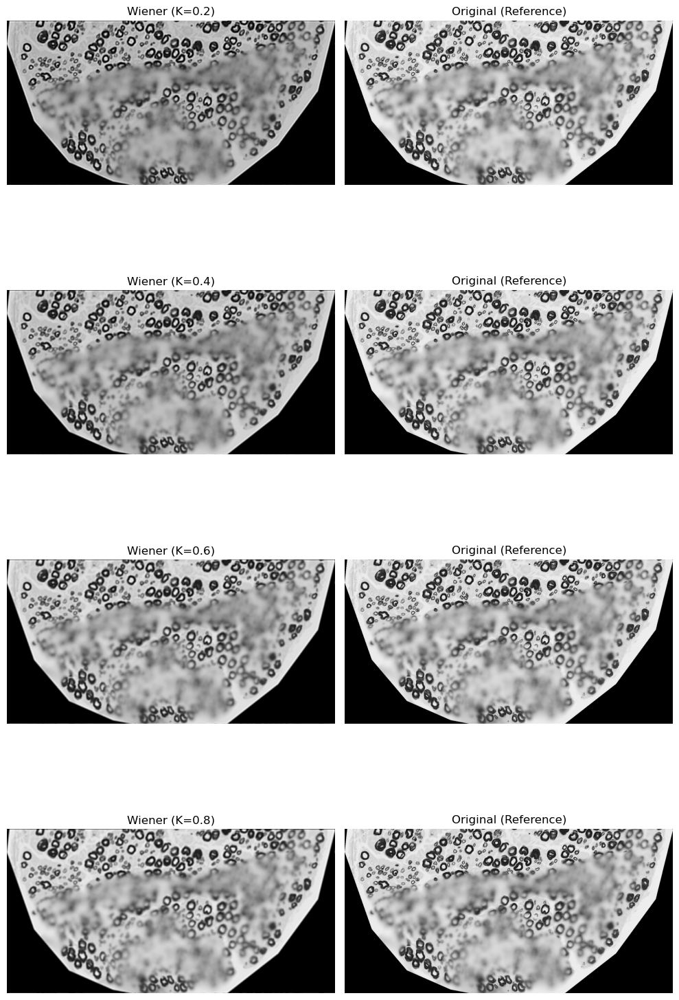

In [50]:
def gaussian_psf(size=21, sigma=3):
    ax = np.arange(-size // 2 + 1., size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    psf = np.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    psf /= np.sum(psf)
    return psf


def wiener_deconvolution(img, psf, K):
    img = img.astype(np.float32) / 255.0

    # Creating the zero array
    psf_padded = np.zeros_like(img)
    kh, kw = psf.shape
    
    # Place PSF in the center of the padded array
    start_h = (img.shape[0] - kh) // 2
    start_w = (img.shape[1] - kw) // 2
    psf_padded[start_h:start_h+kh, start_w:start_w+kw] = psf

    # Use ifftshift to move the center to (0,0) for the FFT

    psf_padded = np.fft.ifftshift(psf_padded)

    # FFT and Deconvolution logic
    IMG = np.fft.fft2(img)
    PSF = np.fft.fft2(psf_padded)

    PSF_conj = np.conj(PSF)
    denom = (np.abs(PSF)**2 + K)

    result = (PSF_conj / denom) * IMG
    result = np.fft.ifft2(result)
    result = np.real(result) 

    result = np.clip(result * 255, 0, 255).astype(np.uint8)
    return result
import cv2
import numpy as np
import matplotlib.pyplot as plt
img_path = r"C:\Users\3kp05\Downloads\4_manual path.png"

img_bgr = cv2.imread(img_path)
if img_bgr is None:
    raise ValueError("Image not found")

gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

ksize = 21
sigma = 3
# blurred = cv2.GaussianBlur(gray, (ksize, ksize), sigma)

psf = gaussian_psf(size=ksize, sigma=sigma)

K_values = [0.2,0.4,0.6,0.8]
# restored = [wiener_deconvolution(blurred, psf, K) for K in K_values]
restored = [wiener_deconvolution(gray, psf, K) for K in K_values]

# DISPLAY RESULTS

rows = len(K_values) + 1   #for reference row
cols = 2

plt.figure(figsize=(10, 4 * rows))

# Reference Row
# plt.subplot(rows, cols, 1)
# plt.imshow(gray, cmap='gray')
# plt.title("Original (Grayscale)")
# plt.axis("off")

# plt.subplot(rows, cols, 2)
# plt.imshow(blurred, cmap='gray')
# plt.title("Gaussian Blurred")
# plt.axis("off")

#  Wiener Rows
for i, (K, rec) in enumerate(zip(K_values, restored), start=1):
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener (K={K})")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")

plt.tight_layout()
plt.show()



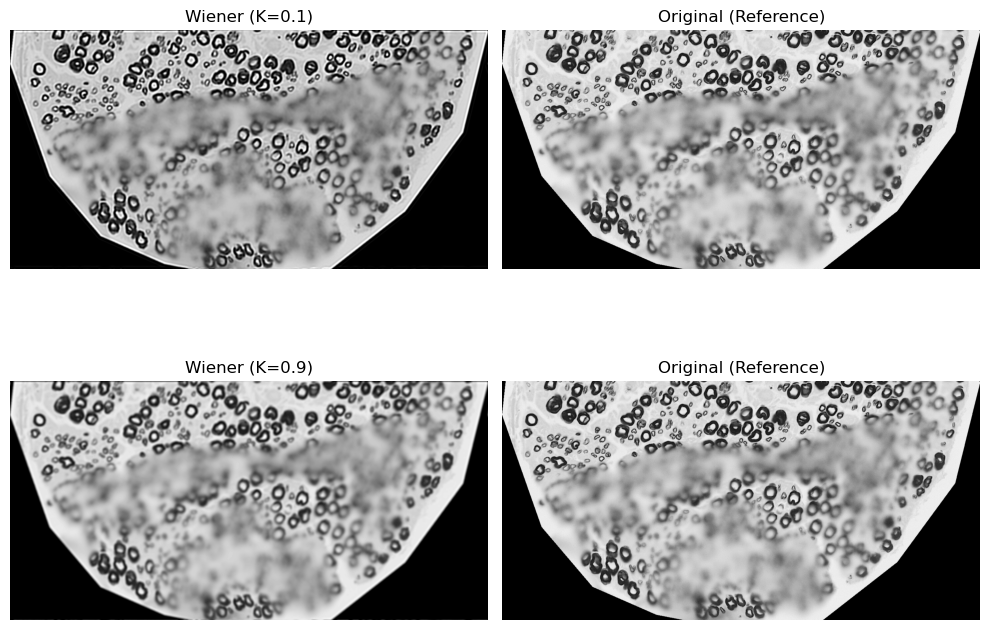

In [51]:

K_values = [0.1,0.9]

restored = [wiener_deconvolution(gray, psf, K) for K in K_values]

rows = len(K_values)
cols = 2

plt.figure(figsize=(10, 4 * rows))

for i, (K, rec) in enumerate(zip(K_values, restored)):
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener (K={K})")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")

plt.tight_layout()
plt.show()


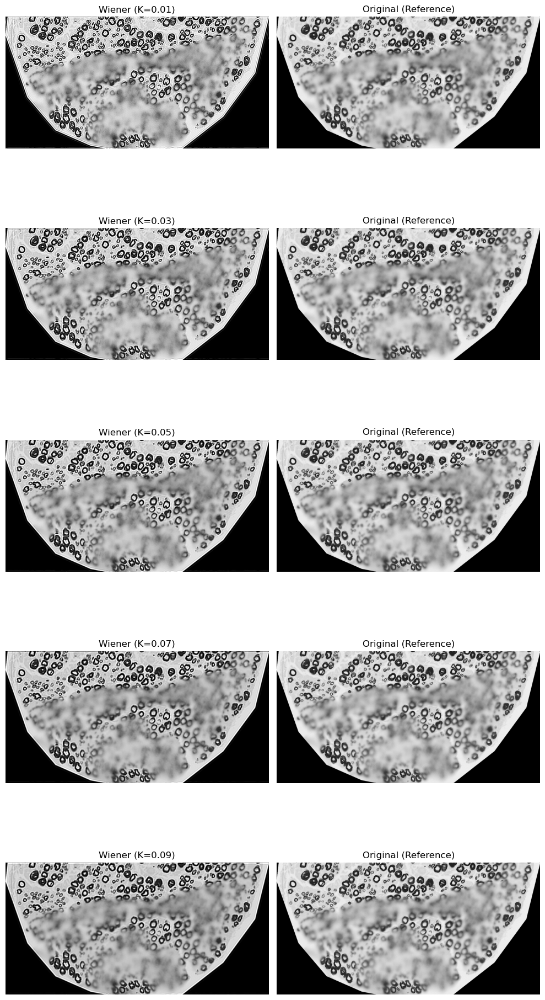

In [52]:

K_values = [0.01,0.03,0.05,0.07,0.09]

restored = [wiener_deconvolution(gray, psf, K) for K in K_values]

rows = len(K_values)
cols = 2

plt.figure(figsize=(10, 4 * rows))

for i, (K, rec) in enumerate(zip(K_values, restored)):
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener (K={K})")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:

K_values = [0.01,0.03,0.05,0.07,0.09]

restored = [wiener_deconvolution(gray, psf, K) for K in K_values]

rows = len(K_values)
cols = 2

plt.figure(figsize=(10, 4 * rows))

for i, (K, rec) in enumerate(zip(K_values, restored)):
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener (K={K})")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")

plt.tight_layout()
plt.show()


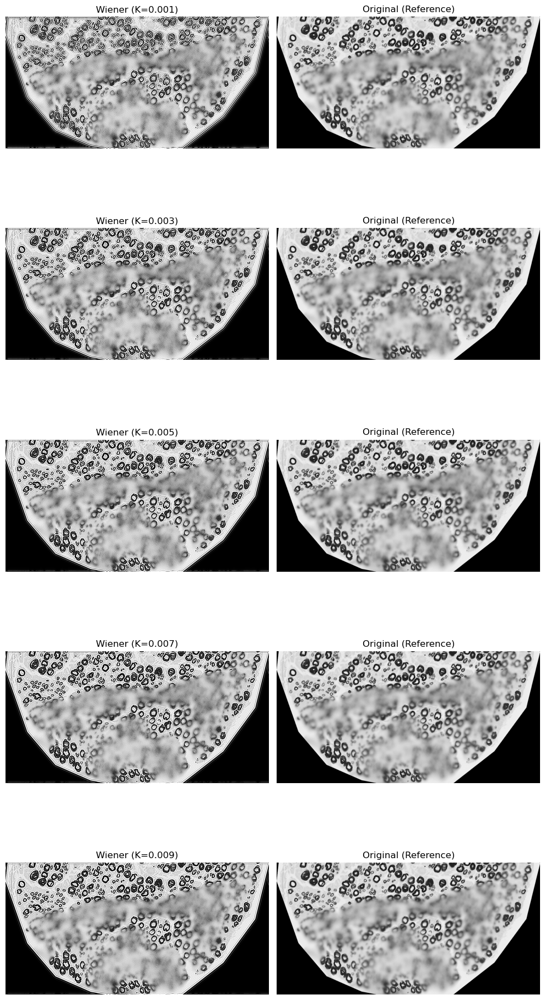

In [53]:

K_values = [0.001,0.003,0.005,0.007,0.009]

restored = [wiener_deconvolution(gray, psf, K) for K in K_values]

rows = len(K_values)
cols = 2

plt.figure(figsize=(10, 4 * rows))

for i, (K, rec) in enumerate(zip(K_values, restored)):
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener (K={K})")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")

plt.tight_layout()
plt.show()


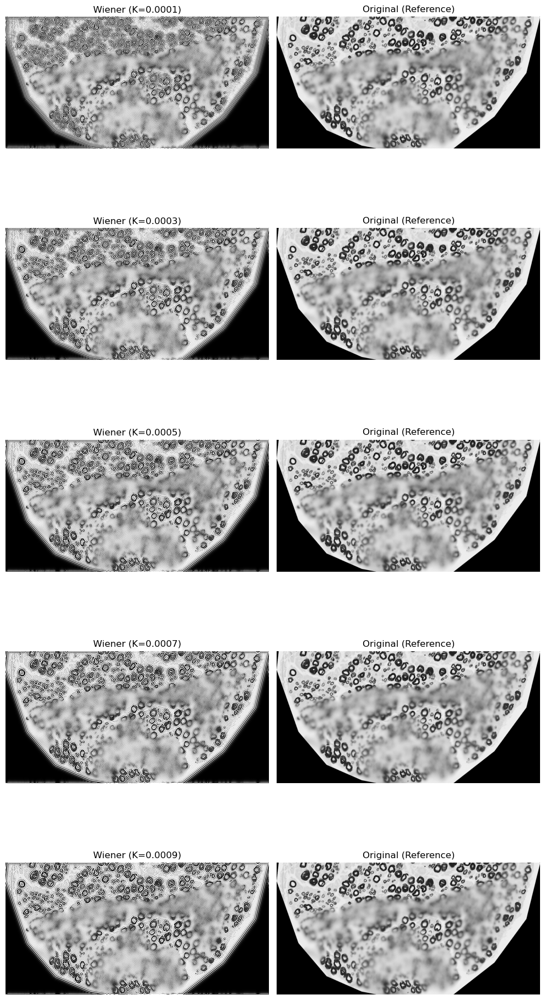

In [54]:

K_values = [0.0001,0.0003,0.0005,0.0007,0.0009]

restored = [wiener_deconvolution(gray, psf, K) for K in K_values]

rows = len(K_values)
cols = 2

plt.figure(figsize=(10, 4 * rows))

for i, (K, rec) in enumerate(zip(K_values, restored)):
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener (K={K})")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")

plt.tight_layout()
plt.show()


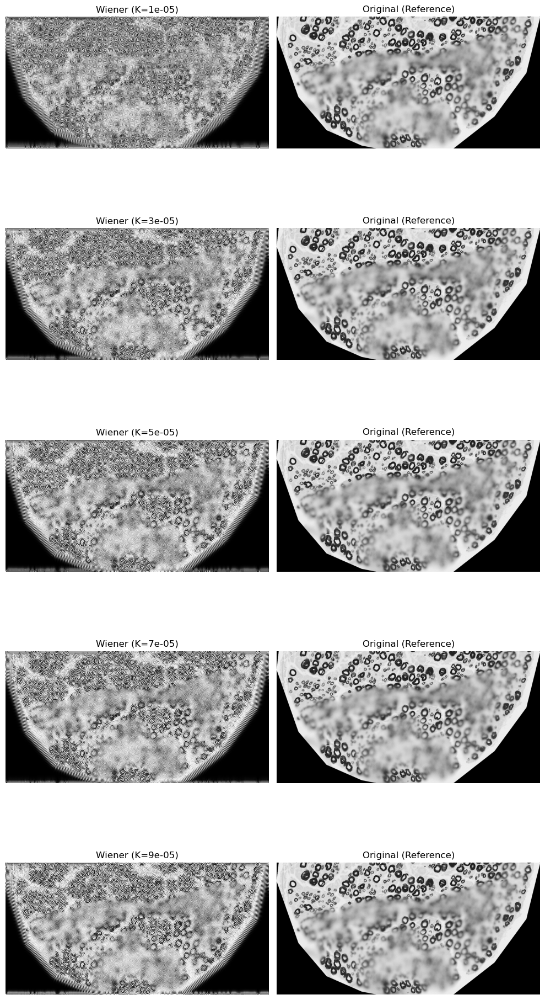

In [55]:

K_values = [0.00001,0.00003,0.00005,0.00007,0.00009]

restored = [wiener_deconvolution(gray, psf, K) for K in K_values]

rows = len(K_values)
cols = 2

plt.figure(figsize=(10, 4 * rows))

for i, (K, rec) in enumerate(zip(K_values, restored)):
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener (K={K})")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")

plt.tight_layout()
plt.show()


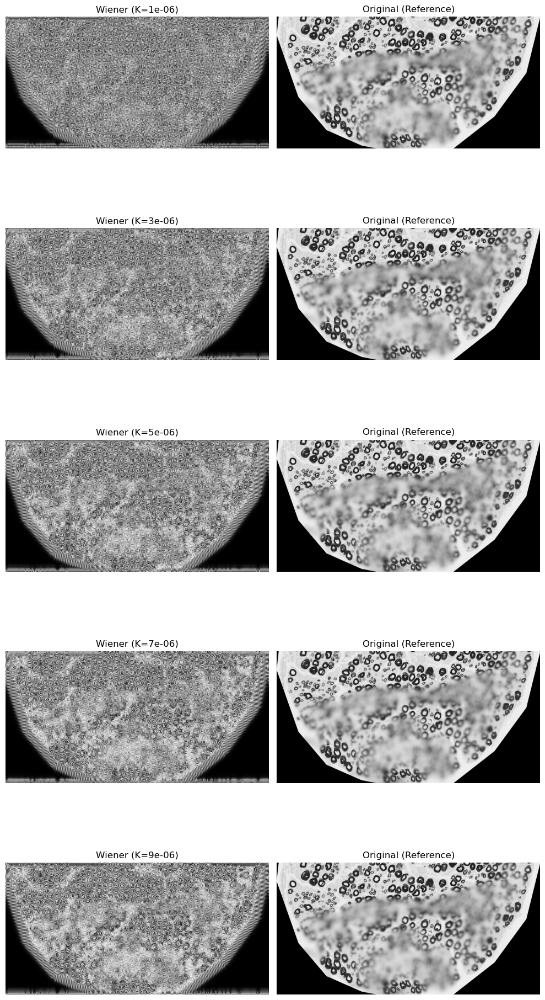

In [56]:

K_values = [0.000001,0.000003,0.000005,0.000007,0.000009]

restored = [wiener_deconvolution(gray, psf, K) for K in K_values]

rows = len(K_values)
cols = 2

plt.figure(figsize=(10, 4 * rows))

for i, (K, rec) in enumerate(zip(K_values, restored)):
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener (K={K})")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")

plt.tight_layout()
plt.show()
